# Analysis notebook of the Load curve model
## Sequence of graphs 
Please note that **all graphs in this notebook are saved in png format** in the folder you can find here : *load_curve_modelling/models/logs/version_number/graphs*
### 1- Load profiles for sectors (either averaged on countries or on month)
##### *Useful to have a look to diversity across either month or countries*
### 2 - Load profiles for each country and month 
##### *Useful to have a more precisde look to load profiles across countries, sectors and month*
### 3 - Load predicted as a function of explanatory variables (temperature, irradiance)
### 4 - Load predicted versus ground truth load
### 5 - Metrics and errors to assess the performance of the model

# 0 - Load packages useful to run the notebook

In [1]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt 
import numpy as np 
import scipy as sp
from sklearn import metrics
import yaml
from omegaconf import OmegaConf
sns.set_style('whitegrid')

# 1 - Load the outputs of the model and its parameters

In [2]:
### Load the output file
version_number = int(input('Enter the version number of the output of the model you could find in load_curve_modelling/models/logs/'))
#scenario = str(input('Enter the scenario name. Choose one in the list : historical, SDS, STEPS') 
scenario = 'historical'
print(f'Version number : {version_number}')
with open(f'logs/version_{version_number}/hparams.yaml', 'r') as f:
    hparams = yaml.safe_load(f)
    WEM_inputs = hparams['WEM_inputs']
if WEM_inputs :
    with open(f'logs/version_{version_number}/hparams_wem.yaml', 'r') as f:
        print('Parameters of the model : \n --------------- ')
        hparams_wem = yaml.safe_load(f)
        parameters = ['n_layers','batch_size','dim_hidden','optimizer_name','dropout_rate','lr','max_epochs','max_epochs_wem','WEM_inputs']
        print(pd.DataFrame.from_dict({ p: hparams_wem[p] for p in parameters },orient = 'index',columns = ['Parameters']))
        print(f"countries supported  {hparams_wem['countries']} \n")
        print(f"Confidence interval on hourly load from WEM  : \n --------------- \n {pd.DataFrame.from_dict(hparams_wem['h_ratio'],orient = 'index', columns = ['Percentage'])}")
    conf = OmegaConf.load(f'logs/version_{version_number}/hparams_wem.yaml')
    if conf.subsector_mapping.res_LI.get('irradiance_penalty_res') : 
        print('\n Lighting RES & SER parameters \n --------------- \n', 'RES', OmegaConf.to_yaml(conf.subsector_mapping.res_LI.irradiance_penalty_res),
                                                                     'SER',OmegaConf.to_yaml(conf.subsector_mapping.ser_LI.irradiance_penalty_ser))
    if conf.subsector_mapping.res_SH.get('heating_penalty') :
        print('\n Heating RES & SER parameters \n --------------- \n','RES', OmegaConf.to_yaml(conf.subsector_mapping.res_SH.heating_penalty),
                                                                'SER',OmegaConf.to_yaml(conf.subsector_mapping.ser_SH.heating_penalty))
    if conf.subsector_mapping.ser_SH.get('heating_penalty') :
        print('\n Cooling RES & SER parameters \n --------------- \n', 'RES', OmegaConf.to_yaml(conf.subsector_mapping.res_SC.cooling_penalty),
                                    'SER', OmegaConf.to_yaml(conf.subsector_mapping.ser_SC.cooling_penalty))
else :    
    with open(f'logs/version_{version_number}/hparams.yaml', 'r') as f:
        print('Parameters of the model : \n --------------- ')
        hparams = yaml.safe_load(f)
        parameters = ['n_layers','batch_size','dim_hidden','optimizer_name','dropout_rate','lr','max_epochs','WEM_inputs']
        print(pd.DataFrame.from_dict({ p: hparams[p] for p in parameters },orient = 'index',columns = ['Parameters']))
        print(f"countries supported  {hparams['countries']} \n")
    conf = OmegaConf.load(f'logs/version_{version_number}/hparams.yaml')
    if conf.subsector_mapping.res_LI.get('irradiance_penalty_res') : 
        print('\n Lighting RES parameters \n --------------- \n', 'RES',OmegaConf.to_yaml(conf.subsector_mapping.res_LI.irradiance_penalty_res),
                                                        'SER', OmegaConf.to_yaml(conf.subsector_mapping.ser_LI.irradiance_penalty_ser))
    if conf.subsector_mapping.res_SH.get('heating_penalty') :
        print('\n Heating RES & SER parameters \n --------------- \n','RES', OmegaConf.to_yaml(conf.subsector_mapping.res_SH.heating_penalty),
                                                                'SER',OmegaConf.to_yaml(conf.subsector_mapping.ser_SH.heating_penalty))
    if conf.subsector_mapping.ser_SH.get('heating_penalty') :
        print('\n Cooling RES & SER parameters \n --------------- \n', 'RES', OmegaConf.to_yaml(conf.subsector_mapping.res_SC.cooling_penalty),
                                    'SER', OmegaConf.to_yaml(conf.subsector_mapping.ser_SC.cooling_penalty))


df_hist_predict = pd.read_csv(f'logs/version_{version_number}/output_{scenario}.csv')
#df_sds = pd.read_csv(f'logs/version_{version_number}/output_SDS2050.csv')
df_hist_predict.utc_timestamp = pd.DatetimeIndex(df_hist_predict.utc_timestamp)

#Create the graphs folder
import os 
directory = 'graphs'
parent_dir = f'logs/version_{version_number}/'
path = os.path.join(parent_dir, directory)
if not os.path.isdir(path) : 
    os.mkdir(path)

df_hist_predict

Enter the version number of the output of the model you could find in load_curve_modelling/models/logs/ 34


Version number : 34
Parameters of the model : 
 --------------- 
               Parameters
n_layers                1
batch_size              4
dim_hidden             40
optimizer_name       adam
dropout_rate            0
lr                  0.001
max_epochs            400
WEM_inputs          False
countries supported  ['FRA', 'DEU', 'ITA', 'GBR', 'DNK', 'FIN', 'SWE', 'NOR', 'US_CA', 'US_FL', 'US_NY', 'IND'] 


 Lighting RES parameters 
 --------------- 
 threshold: 150
weight: 5


 Lighting SER parameters 
 --------------- 
 threshold: 150
weight: 5


 Heating RES & SER parameters 
 --------------- 
 RES threshold: 18.0
weight: 1
 SER threshold: 18.0
weight: 1


 Cooling RES & SER parameters 
 --------------- 
 RES threshold: 20.0
weight: 1
 SER threshold: 20.0
weight: 1



,utc_timestamp,is_weekend,weekday,day_of_week,hour_of_day,month,year,country,temperature,irradiance_surface,load,subsector,annual_demand,load_predicted
0,2005-12-31 23:00:00+00:00,True,2,6,0,1,2006,FRA,3.162,0.0,63616.0,clu_01,1.778121e+08,33906.413872
1,2006-01-01 00:00:00+00:00,True,2,6,1,1,2006,FRA,3.083,0.0,63616.0,clu_01,1.778121e+08,32833.992005
2,2006-01-01 01:00:00+00:00,True,2,6,2,1,2006,FRA,3.052,0.0,61480.0,clu_01,1.778121e+08,31979.038231
3,2006-01-01 02:00:00+00:00,True,2,6,3,1,2006,FRA,2.995,0.0,58000.0,clu_01,1.778121e+08,31645.046350
4,2006-01-01 03:00:00+00:00,True,2,6,4,1,2006,FRA,2.907,0.0,55635.0,clu_01,1.778121e+08,31994.821813
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1410355,2019-12-31 14:00:00+00:00,False,0,1,19,12,2019,IND,14.508,0.0,154839.0,ser_SH,3.175300e+07,13290.579612
1410356,2019-12-31 15:00:00+00:00,False,0,1,20,12,2019,IND,13.873,0.0,154711.5,ser_SH,3.175300e+07,22047.839235
1410357,2019-12-31 16:00:00+00:00,False,0,1,21,12,2019,IND,13.304,0.0,155713.5,ser_SH,3.175300e+07,34012.679124
1410358,2019-12-31 17:00:00+00:00,False,0,1,22,12,2019,IND,12.763,0.0,156905.0,ser_SH,3.175300e+07,47887.654778


In [3]:
##### Set a color palette for better visualization over month 

month_colors = ['blue','blueviolet','salmon','tomato',
                'orangered','red','crimson','firebrick',
               'yellow','yellowgreen','deepskyblue','dodgerblue']
sns.set_palette(sns.color_palette(month_colors))

# 2 - Load profiles graphs

## 2.1 - WEM Load profiles 

In [4]:
if WEM_inputs : 
    sector_wem = ['load_01','load_res_li','load_ser_LI','load_ser_SH','load_res_SH','load_res_SC','load_ser_SC']
    df_wem = df_hist_predict[df_hist_predict.load_01.notna()].melt(id_vars=['country', 'utc_timestamp', 'year', 'month', 'is_weekend', 'hour_of_day'], value_vars= sector_wem, var_name='load_type', value_name='load')
    ax = sns.relplot(x = 'hour_of_day',y = 'load',col = 'load_type',hue = 'month', kind='line',palette = 'coolwarm',legend = 'full', col_wrap=3,data = df_wem,facet_kws=dict(sharey=False),ci = None)
    ax.fig.subplots_adjust(top=0.93)
    ax.fig.suptitle('WEM Load Profile for sector averaged on countries', fontsize = 20, fontweight = 'bold')
    ax.set(ylim = (0))
    plt.savefig(f'logs/version_{version_number}/graphs/wem_sector_load_hue_month.png')
else : pass

## 2.2 - Load profile predicted by the model

### 2.2.1 - Load profile global overview

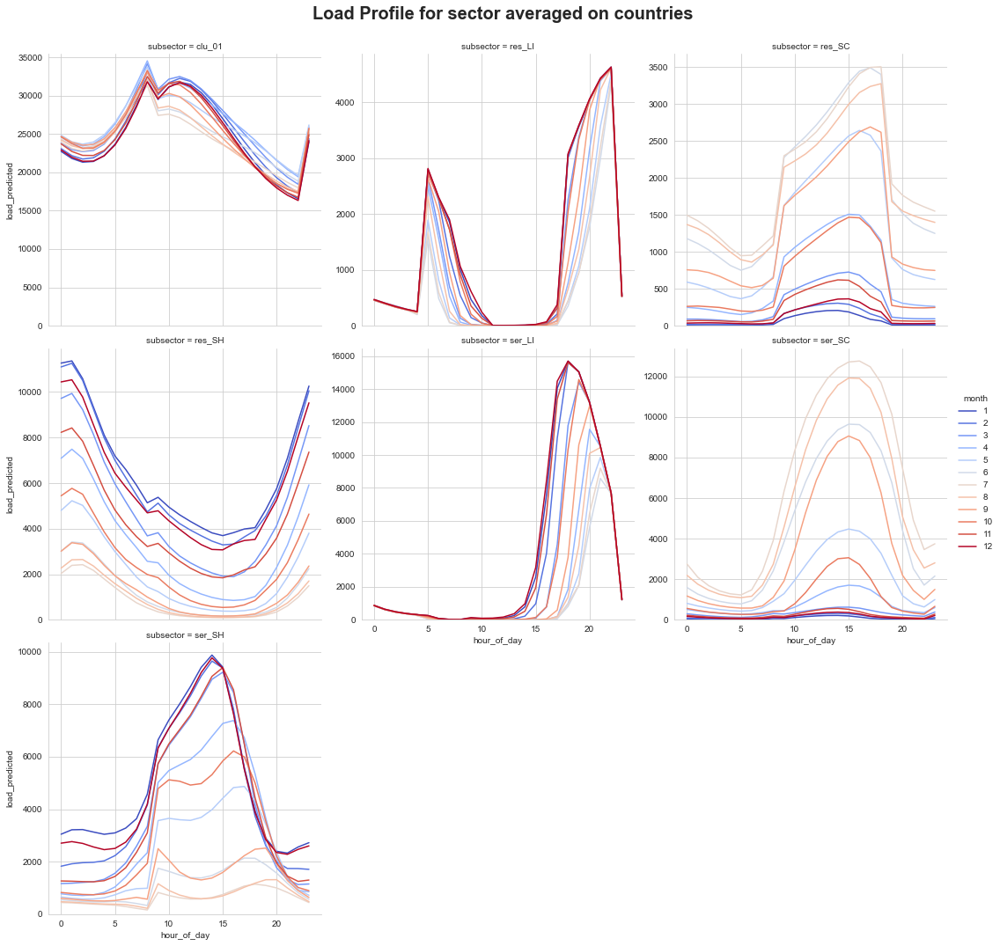

In [5]:
ax = sns.relplot(x='hour_of_day', y='load_predicted',col = 'subsector',hue = 'month', kind='line', col_wrap=3, 
            data=df_hist_predict,palette = 'coolwarm',legend = 'full',facet_kws=dict(sharey=False),ci = None)
ax.fig.subplots_adjust(top=0.93)
ax.fig.suptitle('Load Profile for sector averaged on countries', fontsize = 20, fontweight = 'bold')
ax.set(ylim = (0))
plt.savefig(f'logs/version_{version_number}/graphs/sector_load_hue_month.png')

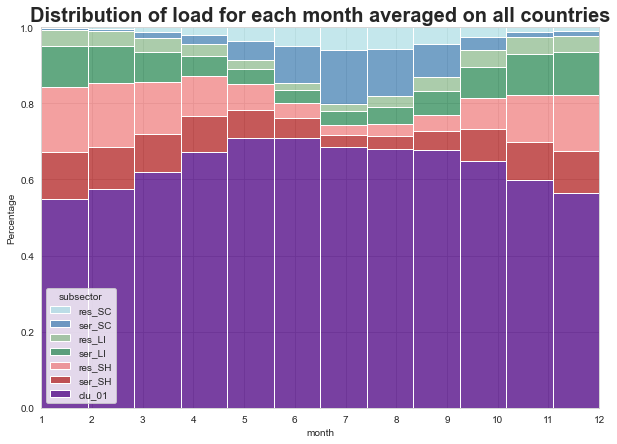

In [6]:
#Data engineering on LC Model outputs
df_month_sub = df_hist_predict.groupby(['country','month','subsector'])[['load_predicted']].sum()
df_month = df_hist_predict.groupby(['country','month'])[['load_predicted']].sum()
df_month_sub['load_predicted_normalized'] = (df_month_sub.load_predicted/df_month.load_predicted).values
df_month_sub.reset_index(inplace = True)

#Plotting the graps

plt.figure(figsize = (10,7))
df_month_sub_plot = df_month_sub.copy()
df_month_sub_plot.load_predicted_normalized = df_month_sub_plot.load_predicted_normalized/len(df_month_sub_plot.country.unique().tolist())
hue_order = ['res_SC','ser_SC','res_LI','ser_LI','res_SH','ser_SH','clu_01']
colors = ['powderblue','steelblue','darkseagreen','seagreen','lightcoral','firebrick','indigo']
sns.histplot(x = 'month',weights ='load_predicted_normalized',data = df_month_sub_plot,hue = 'subsector',hue_order = hue_order , palette = colors, multiple = 'stack',bins = 12,shrink = 1) 
plt.title('Distribution of load for each month averaged on all countries',fontsize = 20, fontweight = 'bold')
plt.xlim((1,12))
plt.ylim((0,1))
plt.xticks([i for i in range(1,13)])
plt.ylabel('Percentage')
#ax.legend(bbox_to_anchor=(1.15, 1),borderaxespad=0)

plt.savefig(f'logs/version_{version_number}/graphs/dist_load_month.png')

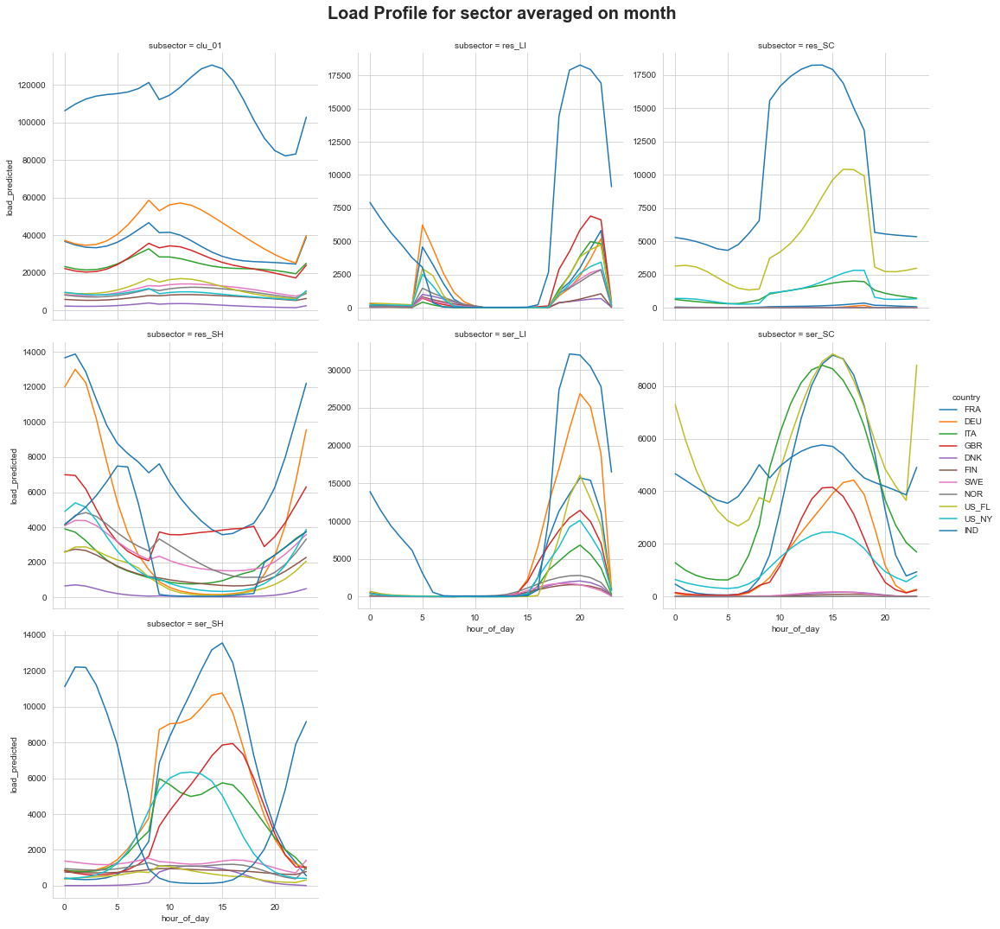

In [7]:
ax = sns.relplot(x='hour_of_day', y='load_predicted',col = 'subsector',hue = 'country', kind='line', col_wrap=3, 
            data=df_hist_predict,palette = 'tab10',legend = 'full',facet_kws=dict(sharey=False),ci = None)
ax.fig.subplots_adjust(top=0.93)
ax.fig.suptitle('Load Profile for sector averaged on month', fontsize = 20, fontweight = 'bold')
plt.savefig(f'logs/version_{version_number}/graphs/sector_load_hue_country.png')

### 2.2.2 - Load profile by end-use

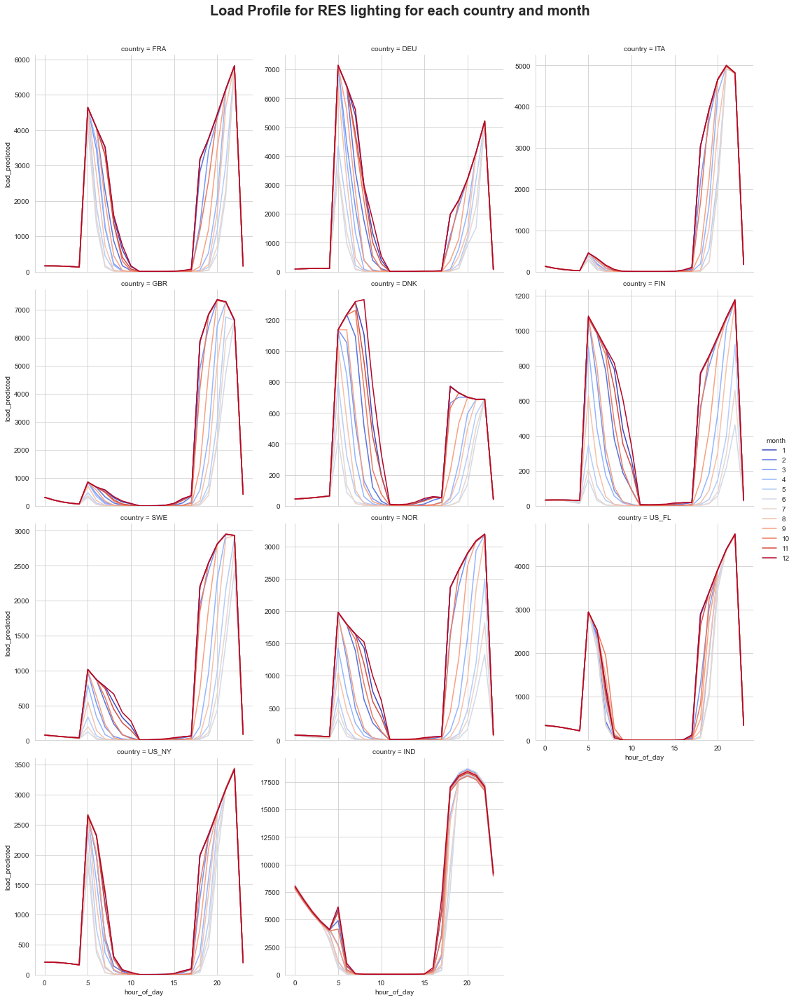

In [8]:
ax = sns.relplot(x='hour_of_day', y='load_predicted', col='country', hue='month', kind='line', col_wrap=3, 
            data=df_hist_predict[df_hist_predict.subsector=='res_LI'],palette = 'coolwarm',legend = 'full',facet_kws=dict(sharey=False),ci = None)
ax.fig.subplots_adjust(top=0.93)
ax.fig.suptitle('Load Profile for RES lighting for each country and month', fontsize = 20, fontweight = 'bold')
ax.set(ylim = (0))
plt.savefig(f'logs/version_{version_number}/graphs/res_lighting.png')

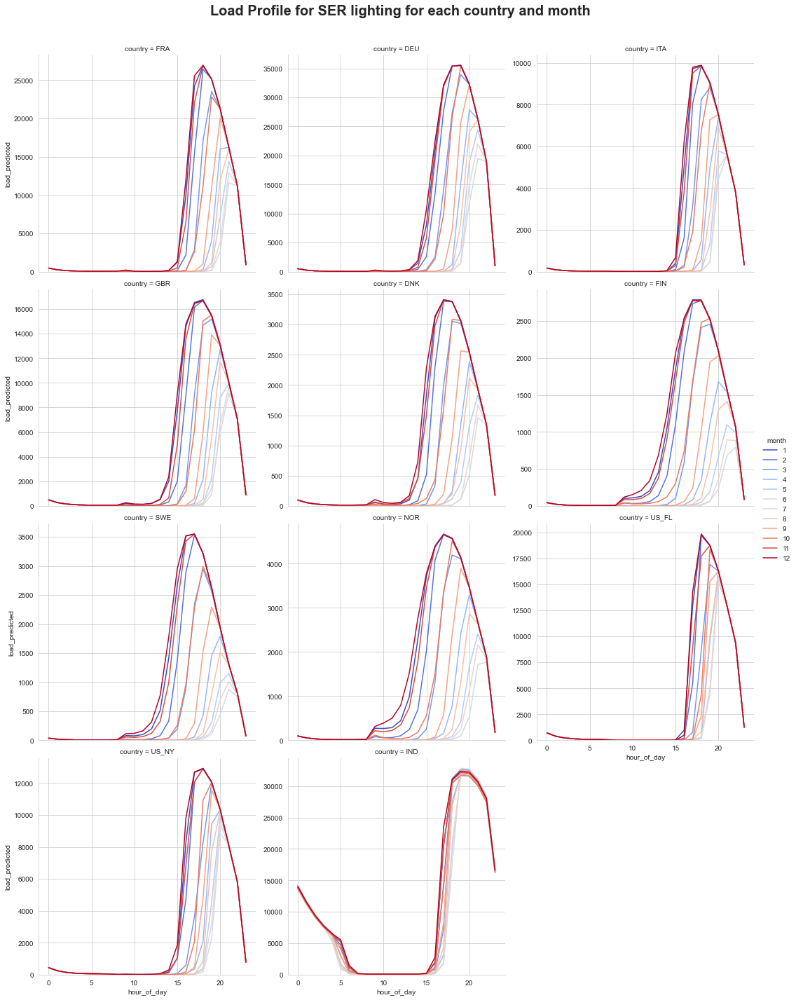

In [9]:
ax = sns.relplot(x='hour_of_day', y='load_predicted', col='country', hue='month', kind='line', col_wrap=3, 
            data=df_hist_predict[df_hist_predict.subsector=='ser_LI'],palette = 'coolwarm',legend = 'full',facet_kws=dict(sharey=False),ci = None)
ax.fig.subplots_adjust(top=0.93)
ax.fig.suptitle('Load Profile for SER lighting for each country and month', fontsize = 20, fontweight = 'bold')
ax.set(ylim = (0))
plt.savefig(f'logs/version_{version_number}/graphs/ser_lighting.png')

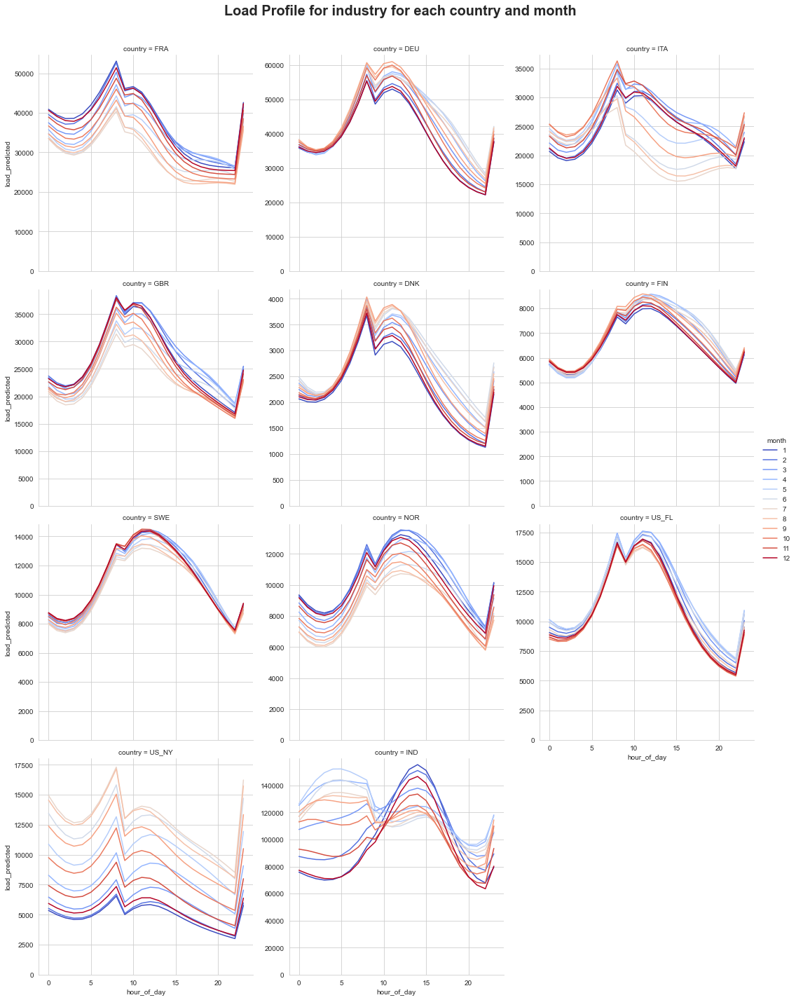

In [10]:
ax = sns.relplot(x='hour_of_day', y='load_predicted', col='country', hue='month', kind='line', col_wrap=3, 
            data=df_hist_predict[df_hist_predict.subsector=='clu_01'],palette = 'coolwarm',legend = 'full',facet_kws=dict(sharey=False),ci = None)
ax.fig.subplots_adjust(top=0.93)
ax.fig.suptitle('Load Profile for industry for each country and month', fontsize = 20, fontweight = 'bold')
ax.set(ylim = (0))
plt.savefig(f'logs/version_{version_number}/graphs/clu_01.png')

Text(0.5, 0.98, 'Load Profile for clu_01 for the 5th month of 2017 averaged on countries')

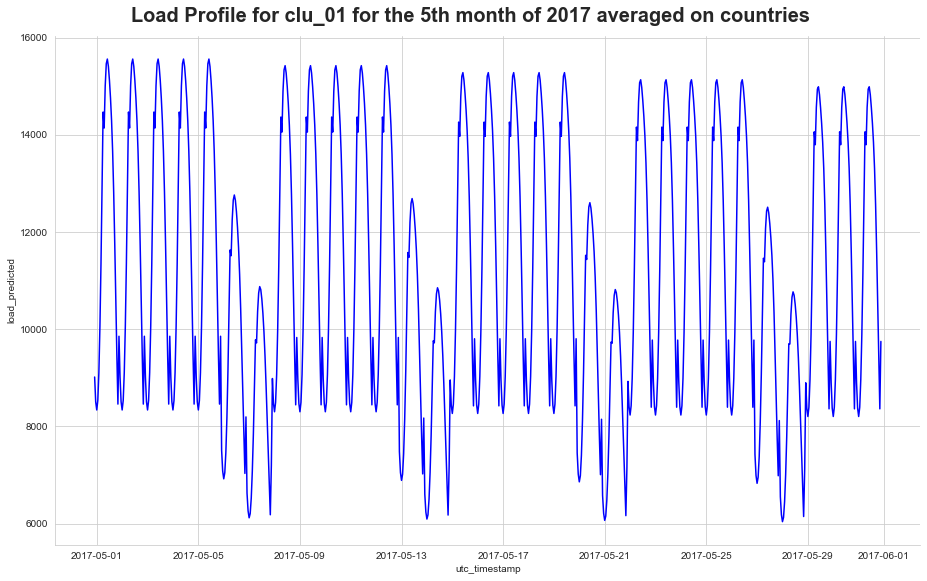

In [11]:
#Can be changed to visualize different graphs
year1 = 2017
month1 = 5
sector1 = 'clu_01'
ax = sns.relplot(x='utc_timestamp', y='load_predicted', kind='line',  
            data=df_hist_predict[(df_hist_predict.subsector==sector1) & (df_hist_predict.month == month1) & (df_hist_predict.year == year1)]
                 ,palette = 'coolwarm',legend = 'full',height = 8, aspect = 1.6, ci = None)
ax.fig.subplots_adjust(top=0.93)
ax.fig.suptitle(f'Load Profile for {sector1} for the {month1}th month of {year1} averaged on countries', fontsize = 20, fontweight = 'bold')

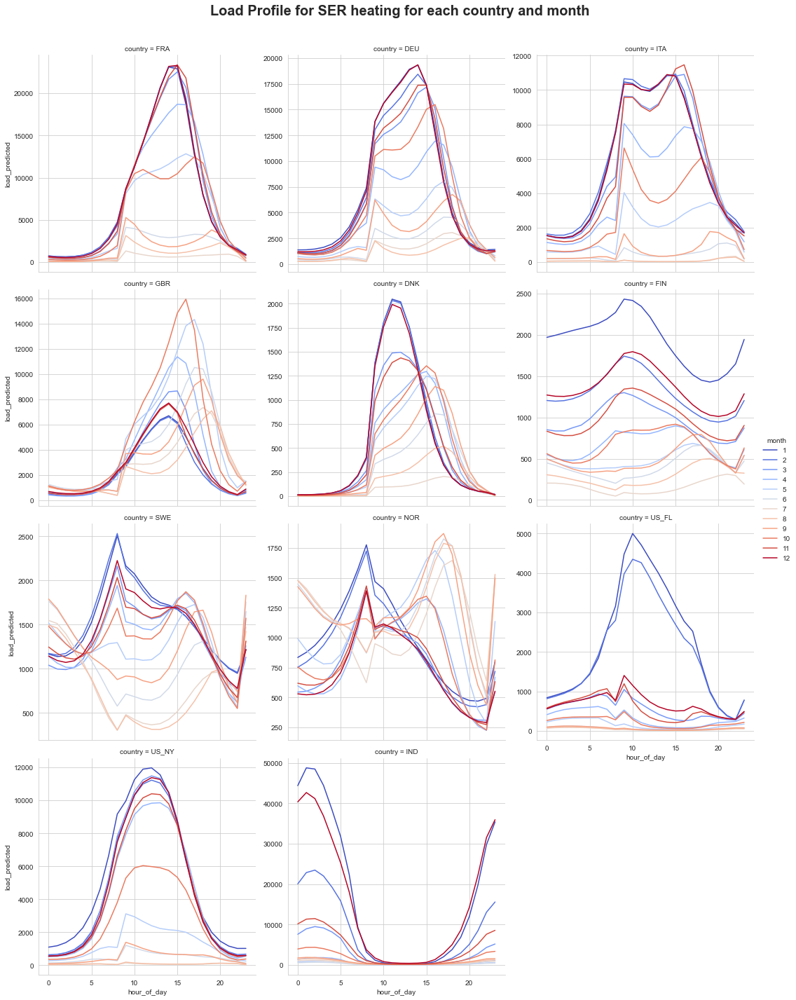

In [12]:
ax = sns.relplot(x='hour_of_day', y='load_predicted', col='country', hue='month', kind='line', col_wrap=3, 
            data=df_hist_predict[df_hist_predict.subsector=='ser_SH'],palette = 'coolwarm',legend = 'full',facet_kws=dict(sharey=False),ci = None)
ax.fig.subplots_adjust(top=0.93)
ax.fig.suptitle('Load Profile for SER heating for each country and month', fontsize = 20, fontweight = 'bold')
plt.savefig(f'logs/version_{version_number}/graphs/ser_heating.png')

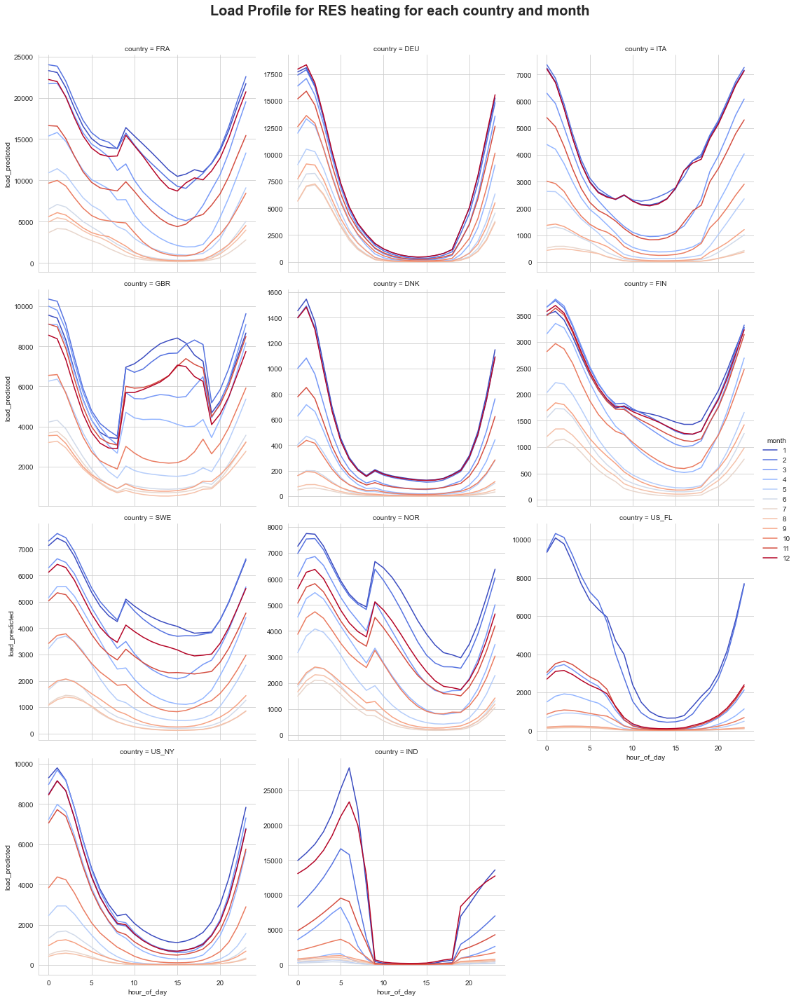

In [13]:
ax = sns.relplot(x='hour_of_day', y='load_predicted', col='country', hue='month', kind='line', col_wrap=3, 
            data=df_hist_predict[df_hist_predict.subsector=='res_SH'],palette = 'coolwarm',legend = 'full',facet_kws=dict(sharey=False),ci = None)
ax.fig.subplots_adjust(top=0.93)
ax.fig.suptitle('Load Profile for RES heating for each country and month', fontsize = 20, fontweight = 'bold')
plt.savefig(f'logs/version_{version_number}/graphs/res_heating.png')

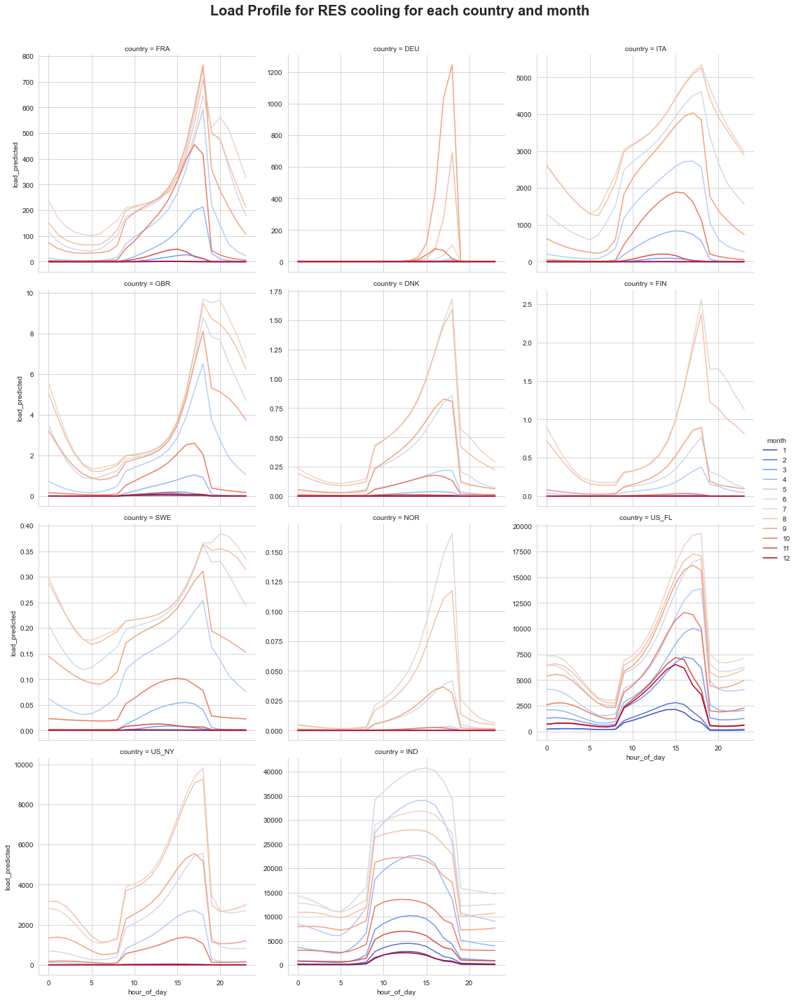

In [14]:
ax = sns.relplot(x='hour_of_day', y='load_predicted', col='country', hue='month', kind='line', col_wrap=3, 
            data=df_hist_predict[df_hist_predict.subsector=='res_SC'],palette = 'coolwarm',legend = 'full',facet_kws=dict(sharey=False),ci =None)
ax.fig.subplots_adjust(top=0.93)
ax.fig.suptitle('Load Profile for RES cooling for each country and month', fontsize = 20, fontweight = 'bold')
plt.savefig(f'logs/version_{version_number}/graphs/res_sc.png')

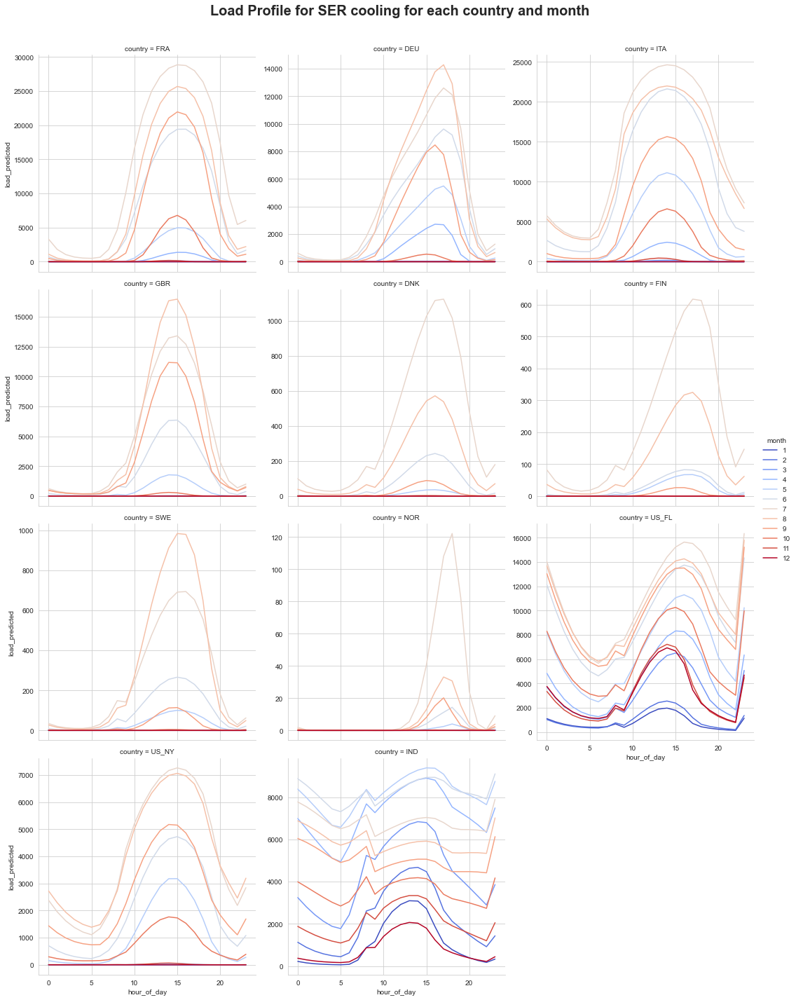

In [15]:
ax = sns.relplot(x='hour_of_day', y='load_predicted', col='country', hue='month', kind='line', col_wrap=3, 
            data=df_hist_predict[df_hist_predict.subsector=='ser_SC'],palette = 'coolwarm',legend = 'full',facet_kws=dict(sharey=False), ci = None)
ax.fig.subplots_adjust(top=0.93)
ax.fig.suptitle('Load Profile for SER cooling for each country and month', fontsize = 20, fontweight = 'bold')
plt.savefig(f'logs/version_{version_number}/graphs/ser_sc.png')

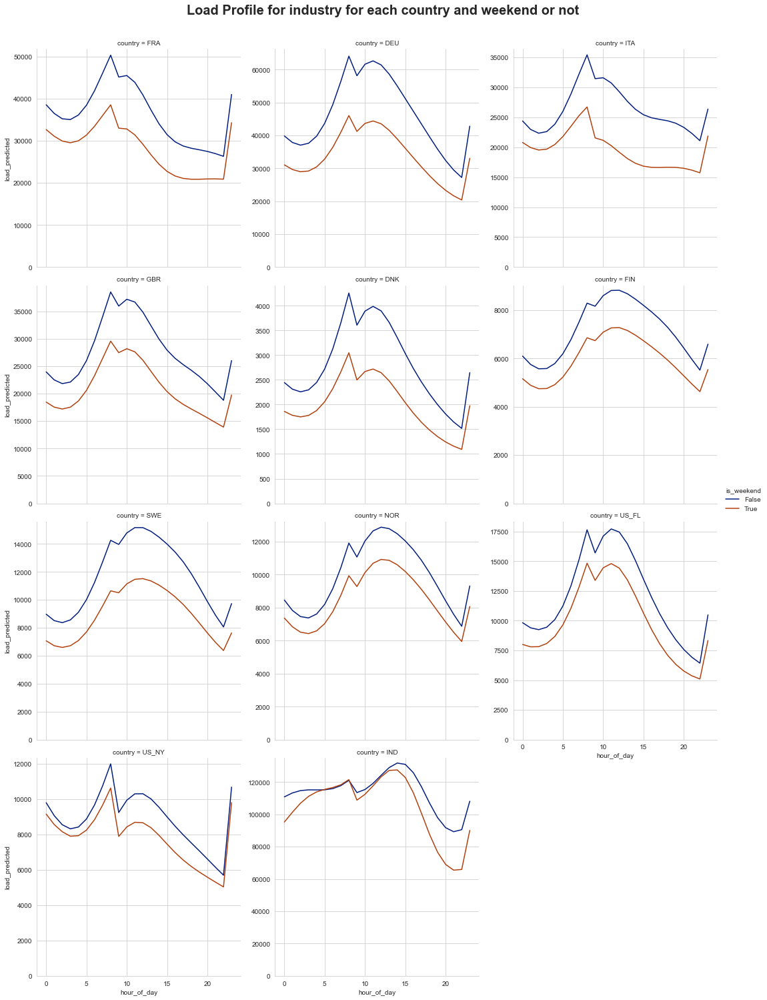

In [16]:
ax = sns.relplot(x='hour_of_day', y='load_predicted', col='country', hue='is_weekend', kind='line', col_wrap=3, 
            data=df_hist_predict[df_hist_predict.subsector=='clu_01'], palette = 'dark',legend = 'full',ci = None, facet_kws = dict(sharey = False))
ax.fig.suptitle('Load Profile for industry for each country and weekend or not ', y = 1.03, fontsize = 20, fontweight = 'bold')
ax.set(ylim = (0))

# 3 - Load curve prediction as a function of explanatory variables


In [17]:
#Can be changed to visualize different graphs
years = {}
print('Available years for the analysis are : ')
for c in list(df_hist_predict.country.unique()):
    years[c] = list(df_hist_predict[df_hist_predict.country == c].year.unique())
    print(c,years[c])
#Define the color palette of next graphs 
curve_colors = ['crimson',
                'deepskyblue']

sns.set_palette(sns.color_palette(curve_colors))
#country = 'DEU'
#year = 2017
#month = 5
#sector = 'CLU_SH'


Available years for the analysis are : 
FRA [2006, 2013, 2014, 2016]
DEU [2007, 2009, 2016]
ITA [2007, 2009, 2012, 2013]
GBR [2016]
DNK [2010]
FIN [2010, 2014, 2016]
SWE [2015, 2017]
NOR [2011, 2016]
US_FL [2016]
US_NY [2018]
IND [2019]


In [25]:
#User interface cell

#country = str(input('Which country to visualize the load comparison ? PS : Choose one in the list above'))
#year = int(input('Which year? PS : Choose one in the list above'))
#month = int(input('Which month (encoded as a number) ?'))
country = 'IND'
year = 2019
month = 5
print(f"-----------------------------\n \nYou have selected {country}, {month}th month of {year} for the load comparison")

-----------------------------
 
You have selected IND, 5th month of 2019 for the load comparison


## 3.1 - Space heating load vs temperature

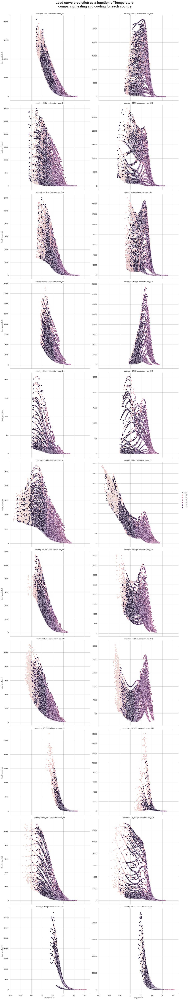

In [19]:
df_filter = df_hist_predict[df_hist_predict.subsector.isin(['ser_SH','res_SH'])]

ax = sns.relplot(x='temperature', y='load_predicted',row = 'country' ,col = 'subsector',hue = 'month',
            data=df_filter,height = 7, aspect = 1, facet_kws=dict(sharey=False))

ax.fig.suptitle(f'Load curve prediction as a function of Temperature \n comparing heating and cooling for each country ' , y = 1.01,fontsize = 18, fontweight = 'bold')
plt.savefig(f'logs/version_{version_number}/graphs/heating.png')

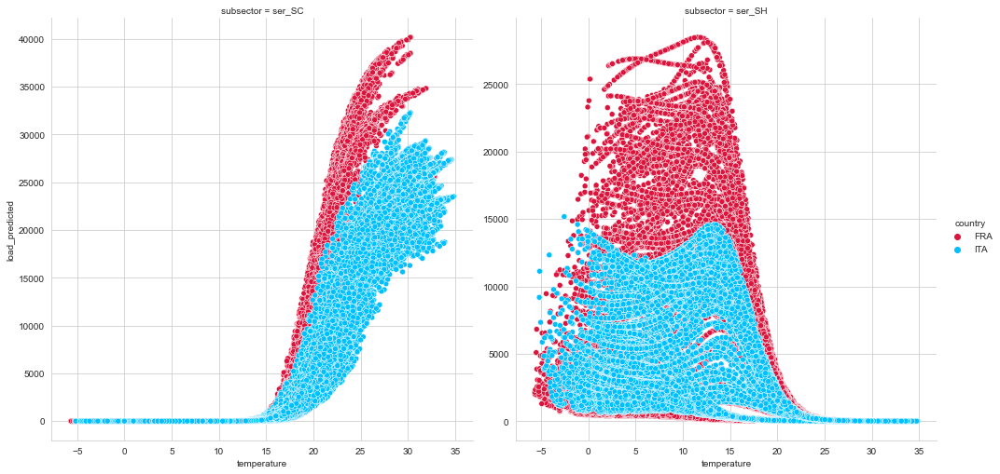

In [20]:
df_filter = df_hist_predict[df_hist_predict.subsector.isin(['ser_SC','ser_SH'])]
df_filter = df_filter[df_filter.country.isin(['ITA','FRA'])]
ax = sns.relplot(x='temperature', y='load_predicted' ,col = 'subsector',hue = 'country',
            data=df_filter,height = 7, aspect = 1, facet_kws=dict(sharey=False))
plt.savefig(f'logs/version_{version_number}/graphs/report.png')

## 3.2 - Space cooling load vs temperature

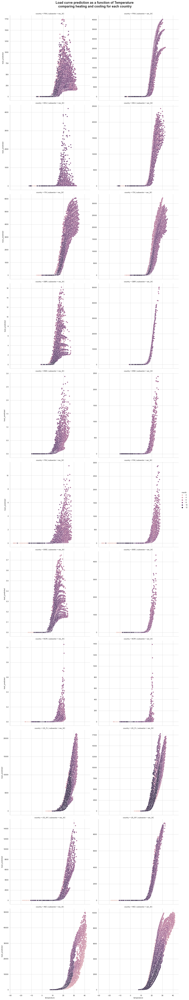

In [21]:
df_filter = df_hist_predict[df_hist_predict.subsector.isin(['res_SC','ser_SC'])]

ax = sns.relplot(x='temperature', y='load_predicted',hue = 'month' ,col = 'subsector', row = 'country',
            data=df_filter,height = 7, aspect = 1,facet_kws=dict(sharey=False))
ax.fig.suptitle(f'Load curve prediction as a function of Temperature \n comparing heating and cooling for each country ' , y = 1.01,fontsize = 18, fontweight = 'bold')
plt.savefig(f'logs/version_{version_number}/graphs/cooling.png')


## 3.3 - Load vs irradiance level

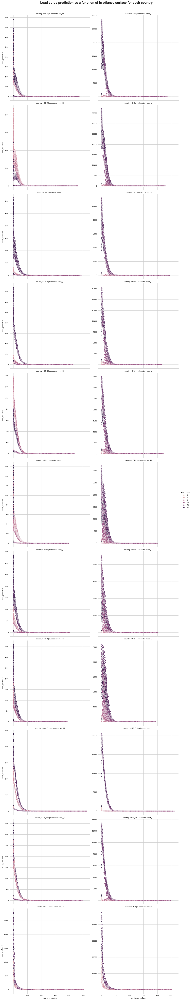

In [22]:
df_filter = df_hist_predict[df_hist_predict.subsector.isin(['res_LI','ser_LI'])]
ax = sns.relplot(x='irradiance_surface', y='load_predicted', hue = 'hour_of_day',col = 'subsector', row = 'country',
            data=df_filter,height = 7, aspect = 1, facet_kws = dict(sharey=False))
ax.fig.suptitle(f'Load curve prediction as a function of irradiance surface for each country' ,y = 1.01,fontsize = 18, fontweight = 'bold')
plt.savefig(f'logs/version_{version_number}/graphs/load_irradiance.png')

# 4 - Load ground truth vs load predicted 

In [26]:
#Compute total load over all sectors.

df_compare_total = df_hist_predict.fillna(0.).groupby(['country', 'utc_timestamp', 'year', 'month', 'is_weekend', 'hour_of_day', 'load']).load_predicted.sum().reset_index()
df_compare_total = df_compare_total.melt(id_vars=['country', 'utc_timestamp', 'year', 'month', 'is_weekend', 'hour_of_day'], value_vars=['load', 'load_predicted'], var_name='load_type', value_name='load')
df_compare_total.utc_timestamp = df_compare_total.utc_timestamp.dt.tz_convert(None)


df_total = df_hist_predict.set_index(['utc_timestamp', 'country', 'is_weekend', 'hour_of_day', 'month', 'year', 
                         'subsector'])['load_predicted'].unstack('subsector').rename_axis(columns=None)
df_total['load_predicted'] = df_total.sum(axis = 1)

df_total1 = df_hist_predict.set_index(['utc_timestamp', 'country', 'is_weekend', 'hour_of_day', 'month', 'year', 
                         'subsector'])['load'].unstack('subsector').rename_axis(columns=None)
df_total1['load_ground_truth'] = df_total1['clu_01']
df_total1.reset_index(inplace = True)
df_total.reset_index(inplace = True)
df_total['load_ground_truth'] = df_total1['load_ground_truth']


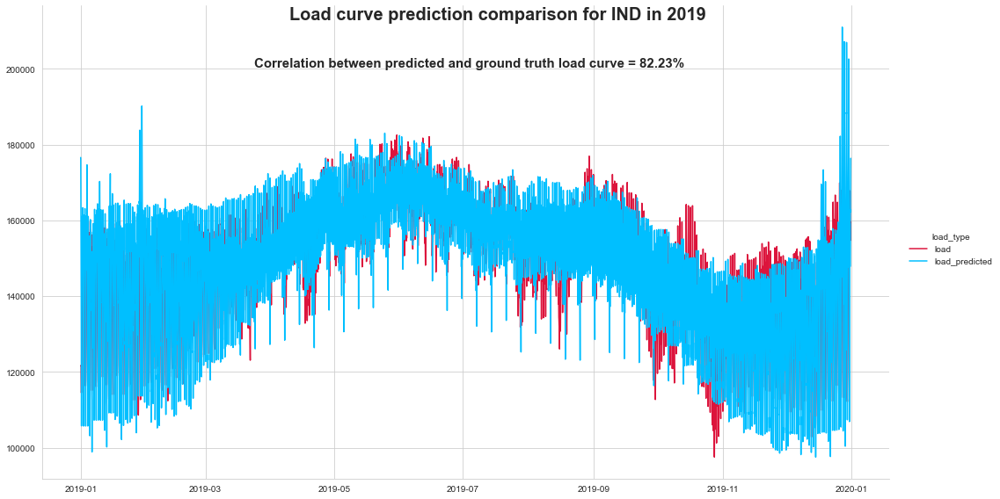

In [27]:
ax = sns.relplot(x='utc_timestamp', y='load', kind='line', hue='load_type',
            data=df_compare_total[(df_compare_total.country==country) & (df_compare_total.year==year)]
                 ,height=8, aspect=1.8, ci = None)
ax.fig.subplots_adjust(top=0.95)

r,p = sp.stats.pearsonr(np.array(df_total[(df_total.country==country) & (df_total.year==year)].load_ground_truth),
                       np.array(df_total[(df_total.country==country) & (df_total.year==year)].load_predicted))

def annotate(data, **kws):
    ax = plt.gca()
    ax.text(.25, .87, 'Correlation between predicted and ground truth load curve = {:.2f}%'.format(100*r),
            transform=ax.transAxes,fontsize = 15,fontweight = 'bold')
    
ax.map_dataframe(annotate)
ax.fig.suptitle(f'Load curve prediction comparison for {country} in {year}', fontsize = 20, fontweight = 'bold')

plt.savefig(f'logs/version_{version_number}/graphs/total_load.png')

## 4.1 - Regression

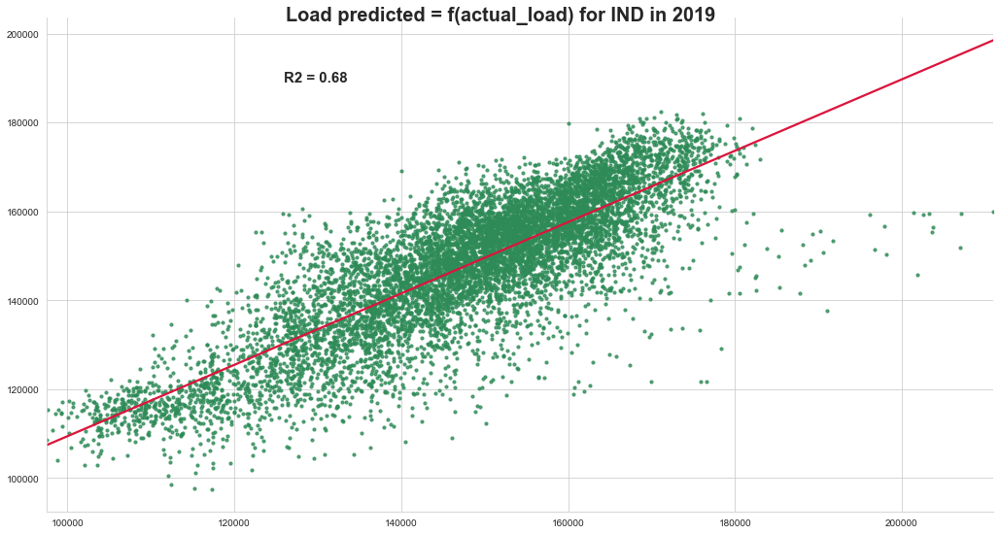

In [28]:
ax = sns.lmplot(x='load_predicted', y='load_ground_truth',
            data=df_total[(df_total.country==country) & (df_total.year==year)]
                 ,height=8, aspect=1.8, ci = None, scatter_kws = {'s' : 10, 'color' : 'seagreen'})
ax.fig.suptitle(f'Load predicted = f(actual_load) for {country} in {year}', y = 0.95, fontsize = 20, fontweight = 'bold')

def annotate(data, **kws):
    ax = plt.gca()
    ax.text(.25, .87, 'R2 = {:.2f}'.format(r**2),
            transform=ax.transAxes,fontsize = 15,fontweight = 'bold')
ax.map_dataframe(annotate)

plt.savefig(f'logs/version_{version_number}/graphs/regresssion_cloud.png')

## 4.2 Load duration curve

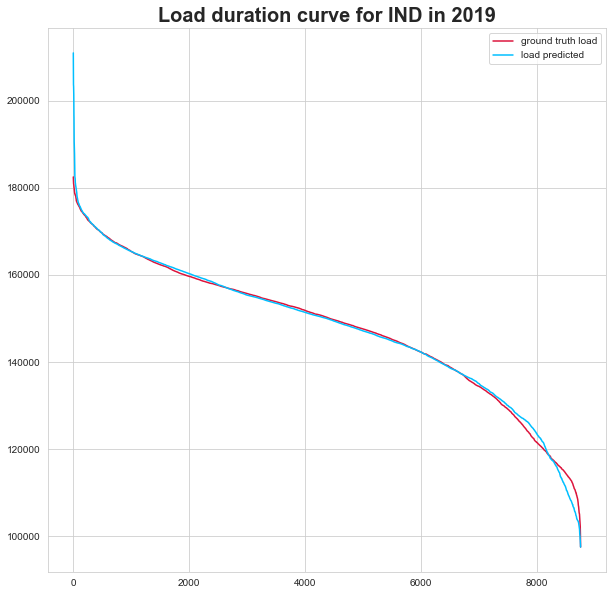

In [29]:
plt.figure(figsize =(10,10))
plt.plot(df_total[(df_total.country==country) & (df_total.year == year)].load_ground_truth.sort_values(ascending=False).values, label = 'ground truth load')
plt.plot(df_total[(df_total.country==country) & (df_total.year == year)].load_predicted.sort_values(ascending=False).values, label = 'load predicted')
plt.legend()
plt.title(f'Load duration curve for {country} in {year}', fontsize = 20 , fontweight = 'bold')
plt.savefig(f'logs/version_{version_number}/graphs/load_duration.png')

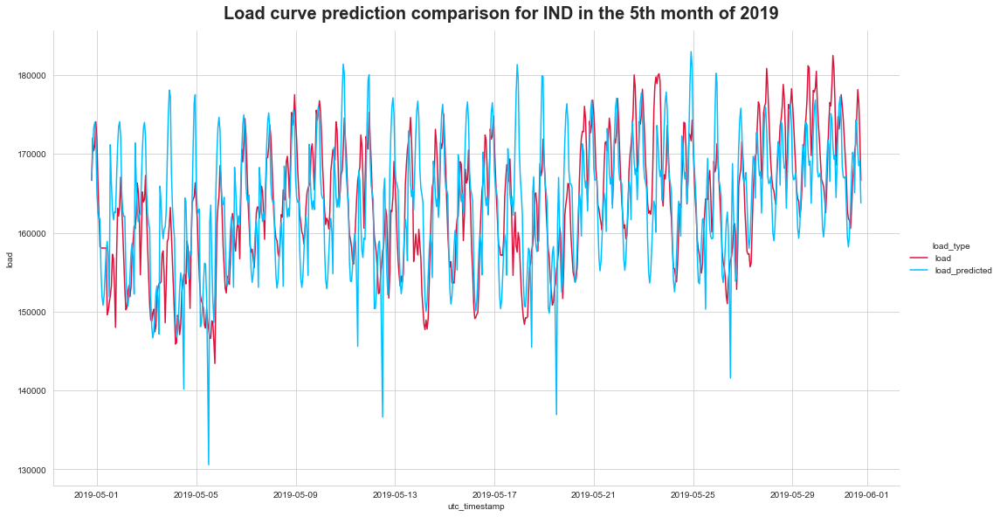

In [30]:
ax = sns.relplot(x='utc_timestamp', y='load', kind='line', hue='load_type',
            data=df_compare_total[(df_compare_total.country==country) & (df_compare_total.year==year)&(df_compare_total.month == month )]
                 ,height=8, aspect=1.8, ci = None,legend = 'full')
ax.fig.subplots_adjust(top=0.95)
ax.fig.suptitle(f'Load curve prediction comparison for {country} in the {month}th month of {year}', y = 1, fontsize = 20, fontweight = 'bold')
plt.savefig(f'logs/version_{version_number}/graphs/zoom_on_total_load.png')

# 5 - Metrics and errors computed to assess the quality of the predicted load 

## Metrics used are : 
#### Absolute deviation in (%) :  $APE  = \left\lvert\frac{y_{pred} - y_{actual}}{y_{actual}}\right\rvert$ and its mean over time $t$ : $MAPE  = \frac{1}{T}\sum_{t}^{8760} \left\lvert\frac{y_{pred,t} - y_{actual, t}}{y_{actual, t}}\right\rvert$

#### Squared error : $SE  = (y_{pred, t} - y_{actual, t})^{2}$ which can be used to calculate Root Mean Squared Error $ RMSE = \sqrt{\frac{1}{T}\sum_{t}^{8760}(y_{pred, t} - y_{actual, t})^{2}} $.  

#### Correlation coefficient : $r = \frac{cov(X,Y)}{\sigma_{X}\sigma_{Y}}$

#### Coefficient of determination $R^2 = r^{2}$ 

In [31]:
#Compute a dataframe with error metrics

load_diff = pd.DataFrame()

load_diff['country']=df_compare_total[df_compare_total.load_type == 'load'].country
load_diff['year']=df_compare_total[df_compare_total.load_type == 'load'].year
load_diff['is_weekend']=df_compare_total[df_compare_total.load_type == 'load'].is_weekend
load_diff['month']=df_compare_total[df_compare_total.load_type == 'load'].month
load_diff['utc_timestamp']=df_compare_total[df_compare_total.load_type == 'load'].utc_timestamp
load_diff['hour_of_day']=df_compare_total[df_compare_total.load_type == 'load'].hour_of_day
load_diff['Absolute_deviation'] = 100*abs(np.array(df_compare_total[df_compare_total.load_type == 'load'].load) - np.array(df_compare_total[df_compare_total.load_type == 'load_predicted'].load))/np.array(df_compare_total[df_compare_total.load_type == 'load_predicted'].load)
load_diff['L2'] = (np.array(df_compare_total[df_compare_total.load_type == 'load'].load) - np.array(df_compare_total[df_compare_total.load_type == 'load_predicted'].load))**2


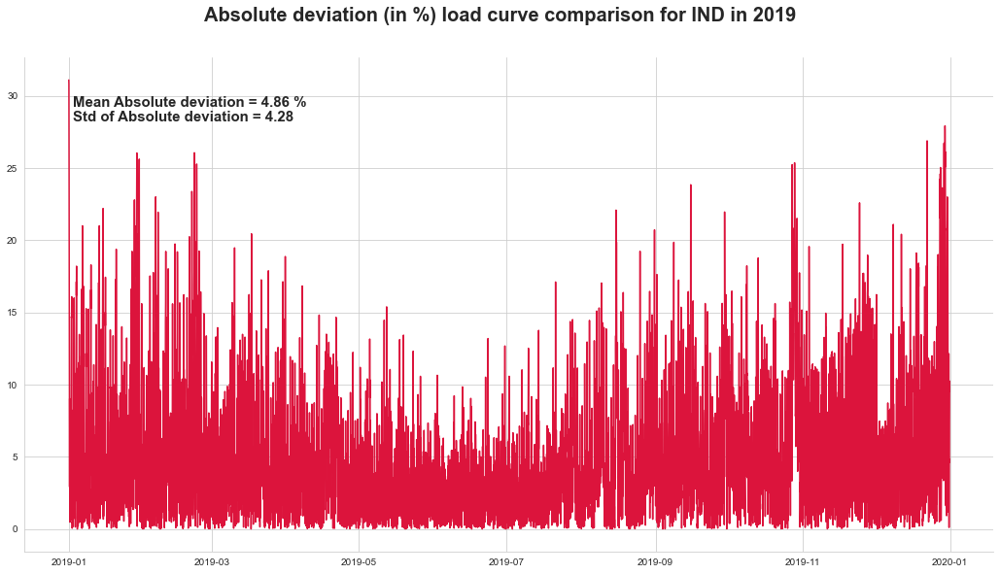

In [32]:
ax =sns.relplot(x='utc_timestamp', y='Absolute_deviation', kind='line',
            data=load_diff[(load_diff.country==country) & (load_diff.year==year)]
                 ,height=8, aspect=1.8, ci = None)
ax.fig.subplots_adjust(top=0.94)
ax.fig.suptitle(f'Absolute deviation (in %) load curve comparison for {country} in {year}', y = 1.02,fontsize = 20, fontweight = 'bold')


def annotate(data, **kws):
    MAPE = np.mean(load_diff[(load_diff.country==country) & (load_diff.year==year)].Absolute_deviation)
    Std_ape = np.std(load_diff[(load_diff.country==country) & (load_diff.year==year)].Absolute_deviation)
    ax = plt.gca()
    ax.text(.05, .9, 'Mean Absolute deviation = {:.2f} %'.format(MAPE),
            transform=ax.transAxes,fontsize = 15,fontweight = 'bold')
    ax.text(.05, .87, 'Std of Absolute deviation = {:.2f}'.format(Std_ape),
            transform=ax.transAxes,fontsize = 15,fontweight = 'bold')
    
ax.map_dataframe(annotate)

Text(0.5, 0.98, 'Squared error load curve comparison for IND in 5th month of 2019')

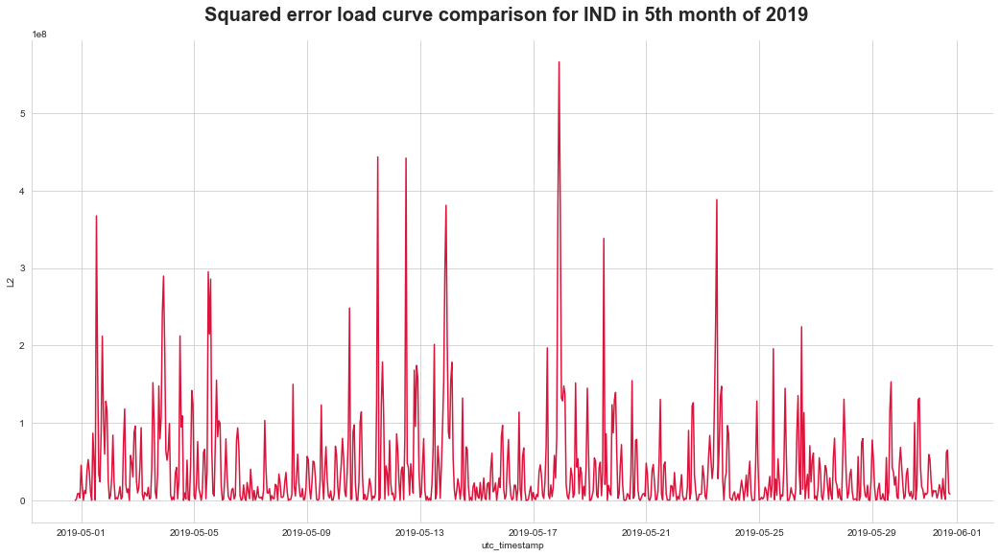

In [33]:
ax =sns.relplot(x='utc_timestamp', y='L2', kind='line',
            data=load_diff[(load_diff.country==country) & (load_diff.year==year)& (load_diff.month == month)]
                 ,height=8, aspect=1.8, ci = None)
ax.fig.subplots_adjust(top=0.92)
ax.fig.suptitle(f'Squared error load curve comparison for {country} in {month}th month of {year}', fontsize = 20, fontweight = 'bold')

In [34]:
#Compute a table with final metrics to evaluate accuracy of prediction

mape = {}
rmse = {}
rcoeff = {}
r2coeff = {}
for c in years.keys():
    r,p = sp.stats.pearsonr(np.array(df_total[(df_total.country==c)].load_ground_truth),
                       np.array(df_total[(df_total.country==c)].load_predicted))
    r2  = metrics.r2_score(np.array(df_total[(df_total.country==c)].load_ground_truth),
                       np.array(df_total[(df_total.country==c)].load_predicted))
    rcoeff[c] = round(100*r,2)
    r2coeff[c] = round(r2,2)
    mape[c] = round(np.mean(load_diff[(load_diff.country==c)].Absolute_deviation),2)
    rmse[c] = round(np.sqrt(np.mean(load_diff[(load_diff.country==c)].L2)),2)
df_mape_country = pd.DataFrame.from_dict(mape,orient = 'index',columns =['Averaged absolute deviation (in %)'])
df_r_country = pd.DataFrame.from_dict(rcoeff,orient = 'index',columns =['Correlation coefficient (in %)'])
df_r2_country = pd.DataFrame.from_dict(r2coeff,orient = 'index',columns =['R2'])
df_rmse_country =  pd.DataFrame.from_dict(rmse,orient = 'index',columns =['RMSE'])                    
df_accuracy_country = pd.concat([df_mape_country,df_r_country,df_r2_country,df_rmse_country],axis = 1)


In [35]:
df_accuracy_country = df_accuracy_country.append(pd.DataFrame(dict(df_accuracy_country.mean()),index = ['Mean']))

#Save the table above. 
df_accuracy_country.to_excel(f'logs/version_{version_number}/metrics_report.xlsx')

#Display it
df_accuracy_country.round(2)

,Averaged absolute deviation (in %),Correlation coefficient (in %),R2,RMSE
FRA,6.63,92.50,0.85,4587.03
DEU,6.11,89.28,0.79,4983.32
ITA,7.18,89.06,0.78,3607.52
GBR,6.63,90.70,0.81,3567.19
DNK,9.65,87.60,0.71,487.35
FIN,4.21,94.88,0.90,538.43
SWE,4.29,96.38,0.93,852.70
NOR,4.68,96.46,0.93,866.08
US_FL,8.57,91.65,0.82,3040.82
US_NY,9.09,86.95,0.66,2028.39


##### This table is saved in this folder : **load_curve_modelling/models/logs/version_number** as  **report_metrics.xlsx**

In [36]:
## 